# OCR in videos with Tesseract and EAST

# Importing the libraries

In [2]:
import cv2
import imutils
import numpy as np
from matplotlib import pyplot as plt
from imutils.object_detection import non_max_suppression
from PIL import Image
from PIL import ImageFont, ImageDraw, Image

In [3]:
#from google.colab.patches import cv2_imshow
def cv2_imshow(img, to_rgb=True):
    if to_rgb:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # BGR -> RGB
    plt.imshow(img)
    plt.show()

In [4]:
DATA_PATH = "../../material/"

# Connecting with Google Drive

In [5]:
#from google.colab import drive
#drive.mount('/content/gdrive')

# Tesseract

In [6]:
#!sudo apt install tesseract-ocr
#!pip install pytesseract 
#!mkdir tessdata
#!wget -O ./tessdata/por.traineddata https://github.com/tesseract-ocr/tessdata/blob/main/por.traineddata?raw=true

In [7]:
import pytesseract

In [8]:
config_tesseract = "--tessdata-dir tessdata --psm 7"

In [9]:
def tesseract_OCR(img, config_tesseract):
    text = pytesseract.image_to_string(img, lang='por', config=config_tesseract)
    return text

# Pre-processing

In [10]:
def pre_processing(img):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Upscale image: 2x size
    resized = cv2.resize(gray, None, fx=2.0, fy=2.0, interpolation=cv2.INTER_CUBIC)
    # Apply Otsu thresholding
    value, otsu = cv2.threshold(resized, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
    return otsu

# EAST

In [11]:
#!cp /content/gdrive/MyDrive/Cursos\ -\ recursos/OCR\ with\ Python/Models/frozen_east_text_detection.pb ./
#!cp -R /content/gdrive/MyDrive/Cursos\ -\ recursos/OCR\ with\ Python/Images images/
#!cp -R /content/gdrive/MyDrive/Cursos\ -\ recursos/OCR\ with\ Python/Fonts fonts/
#!cp -R /content/gdrive/MyDrive/Cursos\ -\ recursos/OCR\ with\ Python/Videos videos/

In [12]:
# EAST params
detector = DATA_PATH + "Models/frozen_east_text_detection.pb"
# EAST works with sizes which are multiples of 320
height_EAST, width_EAST = 640, 640 # 320x320

In [13]:
min_conf_EAST = 0.9

In [14]:
layers_EAST = [
	"feature_fusion/Conv_7/Sigmoid",
	"feature_fusion/concat_3"]

# Functions - EAST

In [15]:
def geometric_data(geometry, y):
    # Extract row-wise geometry data
    xData0 = geometry[0, 0, y]
    xData1 = geometry[0, 1, y]
    xData2 = geometry[0, 2, y]
    xData3 = geometry[0, 3, y]
    angles_data = geometry[0, 4, y]
    
    return angles_data, xData0, xData1, xData2, xData3

In [16]:
def geometric_calculation(angles_data, xData0, xData1, xData2, xData3, x, y):
    # Compute a bounding box from a row-geometry data
    (offsetX, offsetY) = (x * 4.0, y * 4.0)
    angle = angles_data[x]
    cos = np.cos(angle)
    sin = np.sin(angle)
    h = xData0[x] + xData2[x]
    w = xData1[x] + xData3[x]
    
    endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
    endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
    
    beginX = int(endX - w)
    beginY = int(endY - h)
    
    return beginX, beginY, endX, endY

# Function to pre-process the image

In [17]:
def EAST_preprocessing(img, width, height, network, layer_names, min_confidence):
    # This function takes an image and a pre-trained EAST model
    # and obtains all the text bounding boxes in th eimage
    original = img.copy()
    (H, W) = img.shape[:2]
    
    proportion_W = W / float(width)
    proportion_H = H / float(height)
    
    img = cv2.resize(img, (width, height))
    (H, W) = img.shape[:2]
    
    blob = cv2.dnn.blobFromImage(img, 1.0, (W, H), swapRB=True, crop=False)
    
    network.setInput(blob)
    (scores, geometry) = network.forward(layer_names)
    
    (rows, columns) = scores.shape[2:4]
    
    boxes = []
    confidences = []
    
    for y in range(0, rows):
        data_scores = scores[0, 0, y]
        data_angles, x0_data, x1_data, x2_data, x3_data = geometric_data(geometry, y)
    
    for x in range(0, columns):
        if data_scores[x] < min_confidence:
            continue
        
        beginX, beginY, endX, endY = geometric_calculation(data_angles, x0_data, x1_data, x2_data, x3_data, x, y)
        confidences.append(data_scores[x])
        boxes.append((beginX, beginY, endX, endY))
    
    return proportion_W, proportion_H, confidences, boxes

# Function to write on the video

In [18]:
font = DATA_PATH+'Fonts/calibri.ttf'

In [19]:
def write_text(text, x, y, img, font, color=(50, 50, 255), font_size=22):
    # Write a text on the image
    # This function is used by text_background()
    font = ImageFont.truetype(font, font_size)
    img_pil = Image.fromarray(img) 
    draw = ImageDraw.Draw(img_pil) 
    draw.text((x, y-font_size), text, font = font, fill = color) 
    img = np.array(img_pil) 
    
    return img

In [20]:
def text_background(text, x, y, img, font, font_size=32, color=(200, 255, 0)):
    # Place a box with a text on the image
    background = np.full((img.shape), (0,0,0), dtype=np.uint8)
    text_back = write_text(text, x, y, background, font, (255,255,255), font_size=font_size)
    text_back = cv2.dilate(text_back,(np.ones((3,5),np.uint8)))
    fx,fy,fw,fh = cv2.boundingRect(text_back[:,:,2])
    cv2.rectangle(img, (fx, fy), (fx + fw, fy + fh), color, -1)
    
    return img

# Loding EAST

In [21]:
EASTnet = cv2.dnn.readNet(detector)

# Loading the video file 

In [35]:
video_file = DATA_PATH+'Videos/test02.mp4'
capture = cv2.VideoCapture(video_file)
# Check that the video was captured
connected, video = capture.read()

In [36]:
connected

True

In [37]:
# A video is a collection of frames
video

array([[[172, 109,  79],
        [172, 109,  79],
        [172, 109,  79],
        ...,
        [201, 209, 208],
        [199, 209, 208],
        [199, 209, 208]],

       [[172, 109,  79],
        [172, 109,  79],
        [172, 109,  79],
        ...,
        [201, 209, 208],
        [199, 209, 208],
        [199, 209, 208]],

       [[173, 110,  80],
        [173, 110,  80],
        [173, 110,  80],
        ...,
        [201, 209, 208],
        [199, 209, 208],
        [199, 209, 208]],

       ...,

       [[101, 101,  99],
        [101, 101,  99],
        [101, 101,  99],
        ...,
        [ 94,  99, 105],
        [ 94,  99, 105],
        [ 94,  99, 105]],

       [[101, 101,  99],
        [101, 101,  99],
        [101, 101,  99],
        ...,
        [ 34,  39,  45],
        [ 34,  39,  45],
        [ 36,  41,  47]],

       [[101, 101,  99],
        [101, 101,  99],
        [101, 101,  99],
        ...,
        [ 22,  27,  33],
        [ 22,  27,  33],
        [ 22,  27,  33]]

In [38]:
# h, w, c
video.shape

(720, 1284, 3)

In [39]:
video_width = video.shape[1]
video_height = video.shape[0]
print(video_width, video_height)

1284 720


# Resizing the video

In [40]:
def resize_video(width, height, max_width = 600):
    # The size of each frame is very large, we should decrease it
    # to be able to run a OCR online/in time
    if width > max_width:
        proportion = width / height
        video_width = max_width
        video_height = int(video_width / proportion)
    else:
        video_width = width
        video_height = height
    return video_width, video_height

In [41]:
video_width, video_height = resize_video(video.shape[1], video.shape[0], 800)
print(video_width, video_height)

800 448


In [42]:
# Ratio
1284 / 720

1.7833333333333334

In [43]:
800 / 1.78

449.438202247191

# Video settings

In [44]:
# We want to save the resulting video with detected text bboxes
# https://www.programcreek.com/python/example/89348/cv2.VideoWriter_fourcc
name_video_file = 'result_east_tesseract.avi'
# Codec to save the video
fourcc = cv2.VideoWriter_fourcc(*'XVID')
fps = 24
output_video = cv2.VideoWriter(name_video_file, fourcc, fps, (video_width, video_height))

# Processing the video

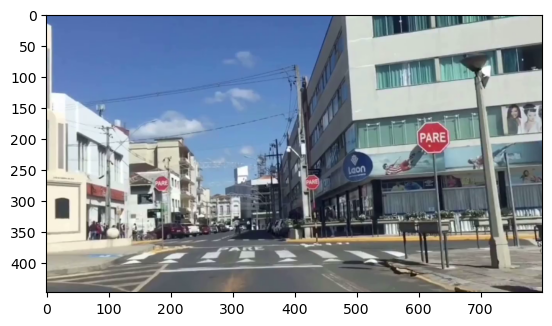

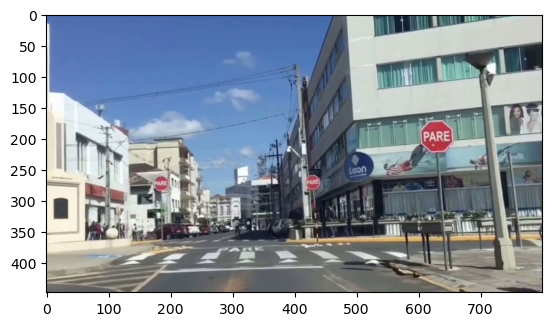

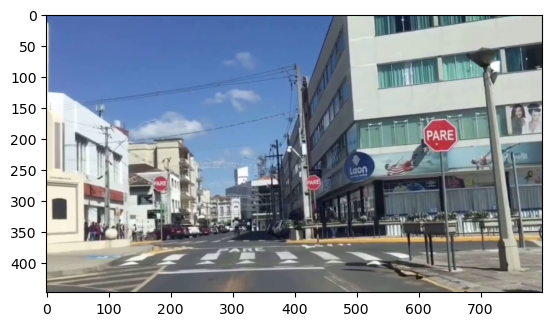

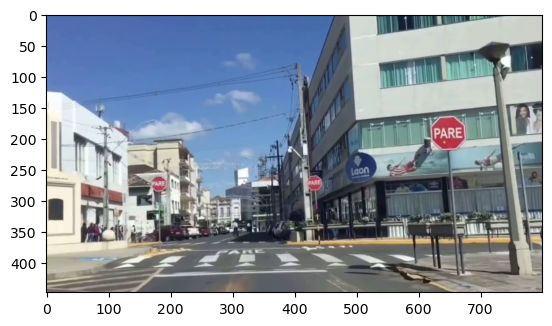

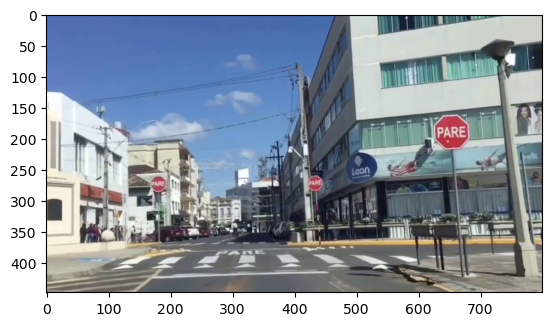

...

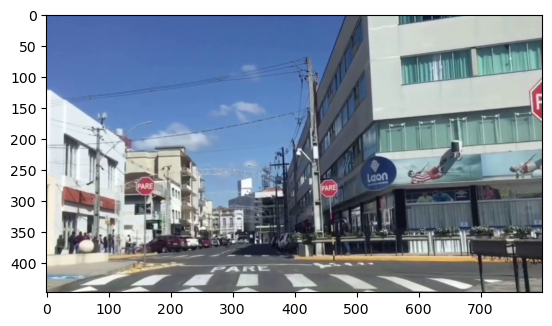

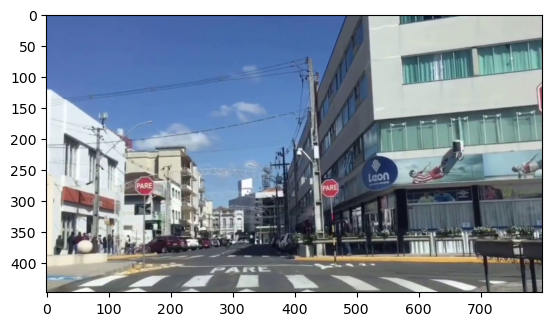

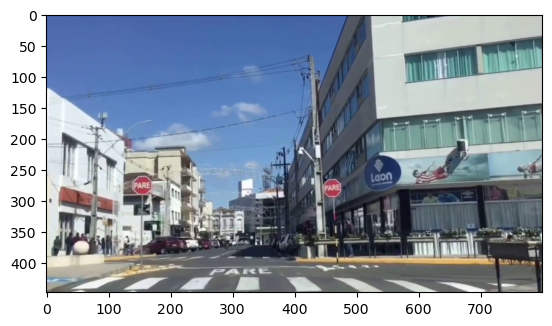

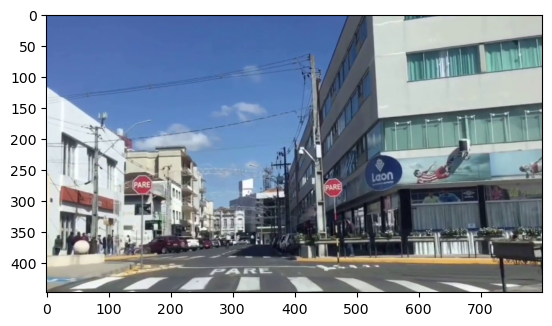

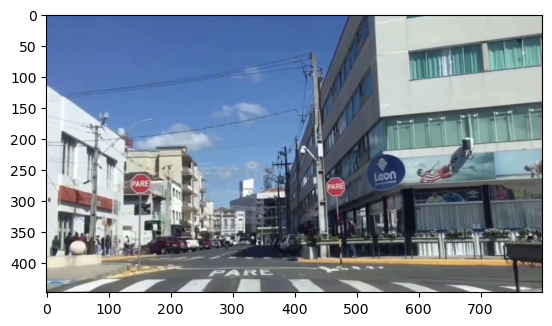

Finished!


In [45]:
# We process 20 frames and show one
show_frames = 20
current_frame = 0
# Margin added around the image
margin = 4

while (cv2.waitKey(1) < 0):
    # Get a frame from capture, whcih contains the video
    connected, frame = capture.read()
    
    if not connected:
        break

    # Resize to smalled size
    frame = cv2.resize(frame, (video_width, video_height))

    # Copy the image and pass it to EAST_preprocessing(), which
    # - processes the image (resize, thresholding, etc.)
    # - detects text strings using Tesseract
    image_cp = frame.copy()
    proportion_W, proportion_H, confidences, boxes = EAST_preprocessing(frame,
                                                                        width_EAST,
                                                                        height_EAST,
                                                                        EASTnet,
                                                                        layers_EAST,
                                                                        min_conf_EAST)
    # Reduce the number of bounding boxes with NMS
    detections = non_max_suppression(np.array(boxes), probs=confidences)
    
    for (beginX, beginY, endX, endY) in detections:
        # Loop through all detections
        # Get all bboxes and expand them to the original size
        beginX = int(beginX * proportion_W)
        beginY = int(beginY * proportion_H)
        endX = int(endX * proportion_W)
        endY = int(endY * proportion_H)
        # Extract the ROI of each of them
        cv2.rectangle(frame, (beginX, beginY), (endX, endY), (200,255,0), 2)
        roi = image_cp[beginY - margin:endY + margin, beginX - margin:endX + margin]
        # Perform OCR with the ROI
        processed_img = pre_processing(roi)
        text = tesseract_OCR(processed_img, config_tesseract)
        print(text)
        # Get the text and plot it with a box on image
        # http://www.asciitable.com/
        text = ''.join([c if ord(c) < 128 else '' for c in text]).strip()
        frame = text_background(text, beginX, beginY, frame, font, 20, (200,255,0))
        frame = write_text(text, beginX, beginY, frame, font, (0,0,0), 20)

    # Display result if necessary
    if current_frame <= show_frames:
        cv2_imshow(frame)
        current_frame += 1
    
    output_video.write(frame)

print('Finished!')
output_video.release()
cv2.destroyAllWindows()

# OCR in videos with EasyOCR

In [46]:
#!pip install easyocr

In [47]:
#!pip uninstall opencv-python-headless
#!pip install opencv-python-headless==4.1.2.30

In [58]:
from easyocr import Reader
import cv2
#from google.colab.patches import cv2_imshow
from PIL import ImageFont, ImageDraw, Image
import numpy as np

In [59]:
languages_list = ['en','pt']
gpu = False # True 
font = DATA_PATH+'Fonts/calibri.ttf' 

In [60]:
video_file = DATA_PATH+"Videos/test02.mp4"
cap = cv2.VideoCapture(video_file)

connected, video = cap.read()
video_width = video.shape[1]
video_height = video.shape[0]

In [61]:
video_width, video_height = resize_video(video.shape[1], video.shape[0], 800)
print(video_width, video_height)

800 448


In [62]:
def box_coordinates(box):
    (lt, rt, br, bl) = box
    lt = (int(lt[0]), int(lt[1]))
    rt = (int(rt[0]), int(rt[1]))
    br = (int(br[0]), int(br[1]))
    bl = (int(bl[0]), int(bl[1]))
    
    return lt, rt, br, bl

In [63]:
def draw_img(img, lt, br, color=(200,255,0),thickness=2):
    cv2.rectangle(img, lt, br, color, thickness)
    
    return img

In [64]:
name_video_file = 'result_easy_ocr.avi'
fourcc = cv2.VideoWriter_fourcc(*'XVID')
fps = 24
output_video = cv2.VideoWriter(name_video_file, fourcc, fps, (video_width, video_height))

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


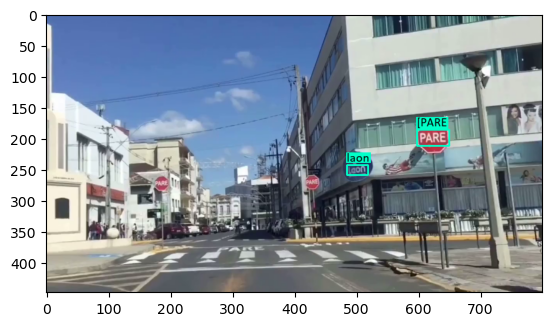

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


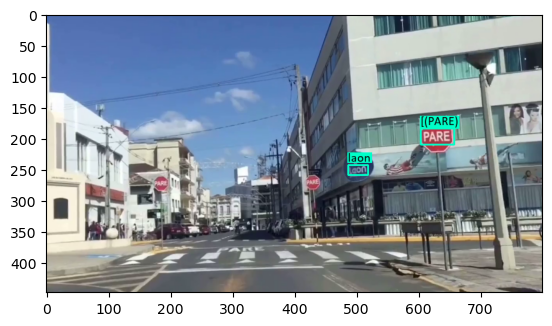

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


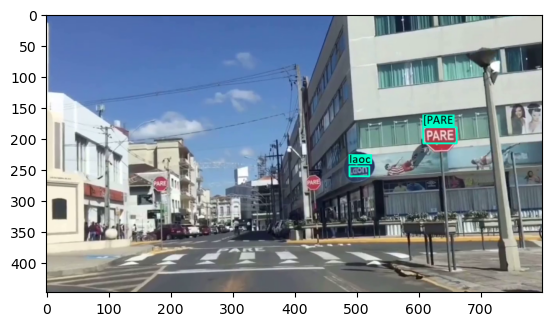

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


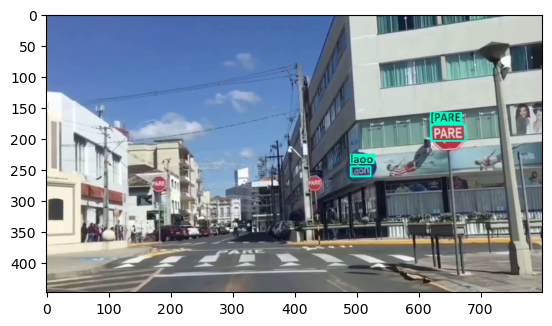

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


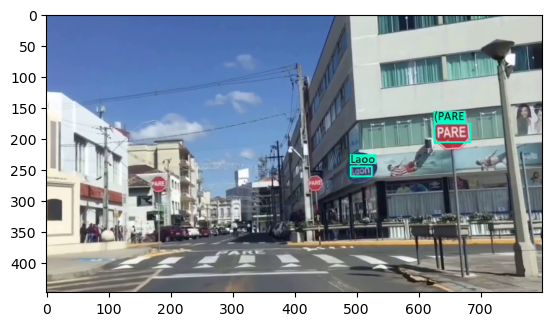

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


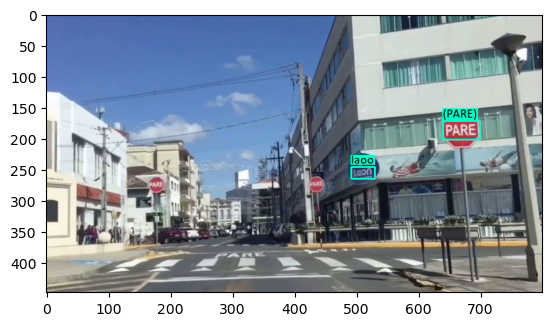

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


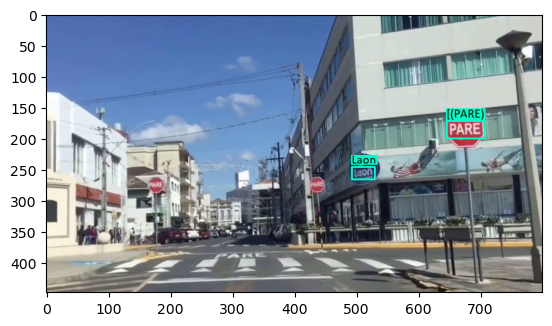

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


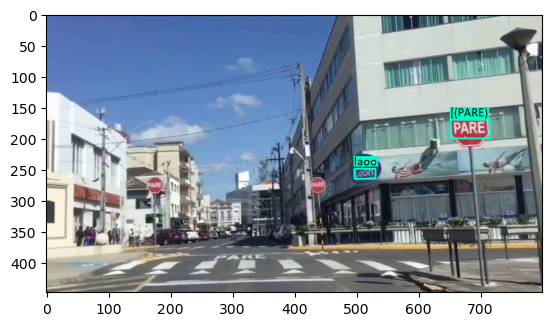

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


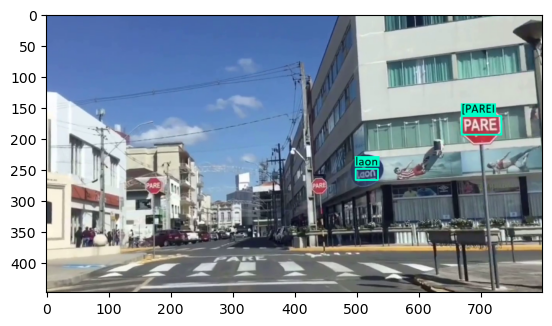

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


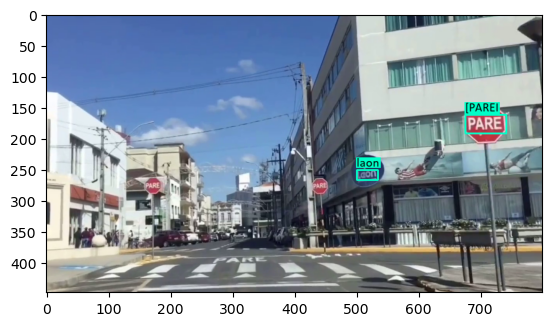

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


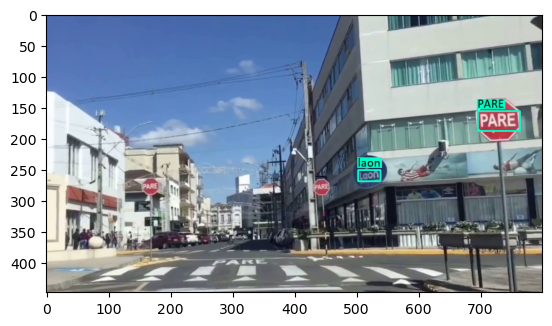

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


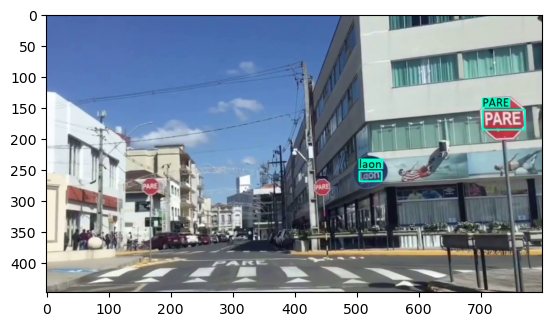

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


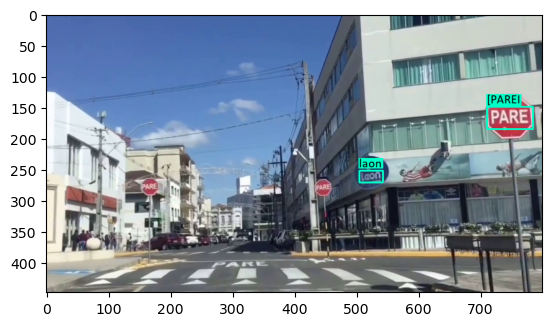

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


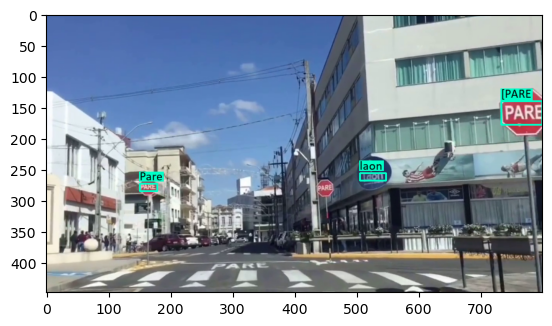

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


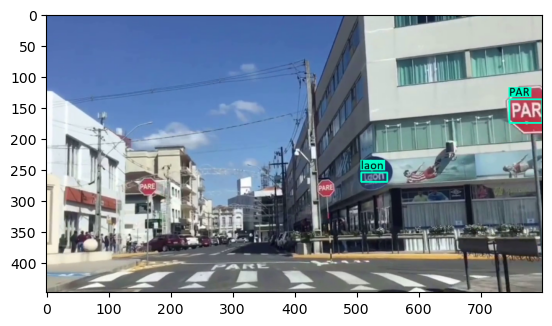

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


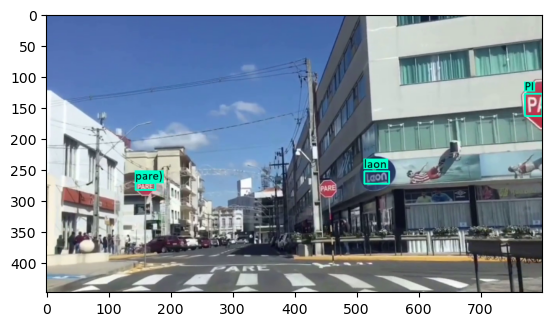

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


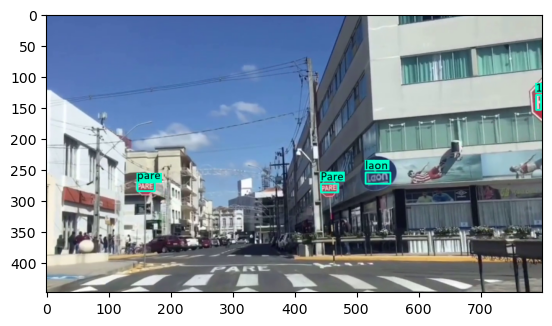

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


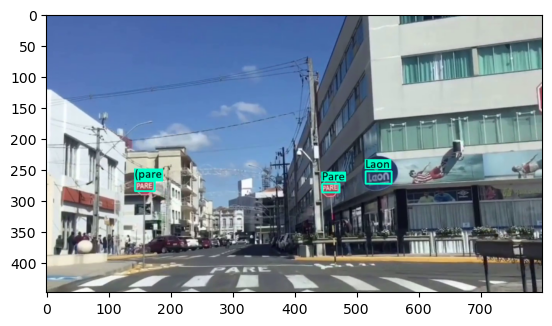

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


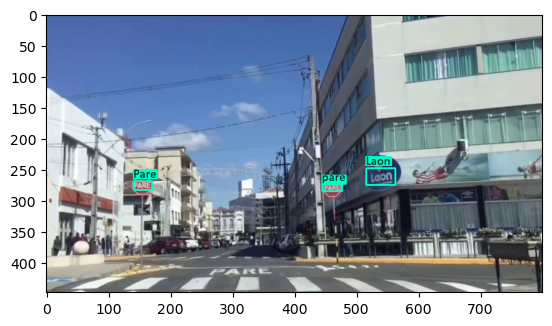

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


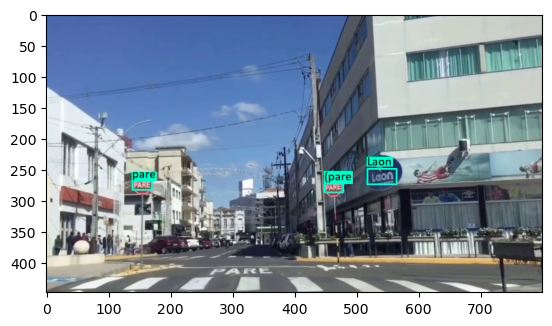

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


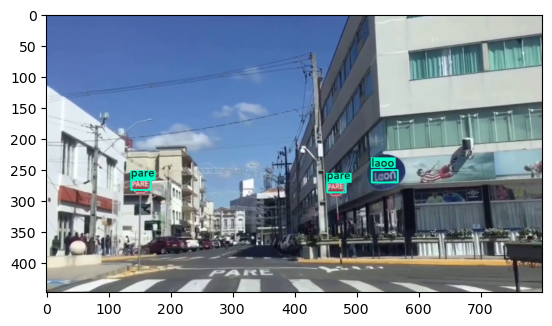

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster wi

Finished!


In [66]:
show_frames = 20
current_frame = 0
margin = 4

while (cv2.waitKey(1) < 0):
    connected, frame = cap.read()
    
    if not connected:
        break
    
    frame = cv2.resize(frame, (video_width, video_height))
    
    image_cp = frame.copy()
    reader = Reader(languages_list, gpu=gpu)
    results = reader.readtext(frame)
    for (box, text, prob) in results:
        lt, rt, br, bl = box_coordinates(box)
        frame = draw_img(frame, lt, br)
        frame = text_background(text, lt[0], lt[1], frame, font, 20, (200,255,0))
        frame = write_text(text, lt[0], lt[1], frame, font, (0,0,0), 20)
    
    if current_frame <= show_frames:
        cv2_imshow(frame)
        current_frame += 1
    
    output_video.write(frame)

print('Finished!')
output_video.release()
cv2.destroyAllWindows()